In [1]:
#import necessary library for data reading and analysis
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
#red the data in using pandas
data = pd.read_csv("adult.csv")

In [4]:
#check basic information about data columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   39              32560 non-null  int64 
 1    State-gov      32560 non-null  object
 2    77516          32560 non-null  int64 
 3    Bachelors      32560 non-null  object
 4    13             32560 non-null  int64 
 5    Never-married  32560 non-null  object
 6    Adm-clerical   32560 non-null  object
 7    Not-in-family  32560 non-null  object
 8    White          32560 non-null  object
 9    Male           32560 non-null  object
 10   2174           32560 non-null  int64 
 11   0              32560 non-null  int64 
 12   40             32560 non-null  int64 
 13   United-States  32560 non-null  object
 14   <=50K          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 2.6+ MB


In [5]:
#getting the columns of the data since they are actual data
first_row = np.array(data.columns)
#check shape of data
first_row.shape

(15,)

above check shows the data has fifteen columns that was changed to rows. now let's change it back

In [6]:
first_row = first_row.reshape(1,-1)
#check new shape
first_row.shape

(1, 15)

In [7]:
#naming the new columns to be used
columns = ["age","workclass","fnlgwt","education","education_num","marital_status","occupation",
           "relationship","race","sex","capital_gain","capital_loss","hours_per_week","native_country","status"]
#changing it here
data.columns = columns

In [8]:
#basic descriptive statistics of the data
data.describe(include="all")

,age,workclass,fnlgwt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,status
count,32560.000000,32560,3.256000e+04,32560,32560.000000,32560,32560,32560,32560,32560,32560.000000,32560.000000,32560.000000,32560,32560
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,2
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,22696,NaN,10501,NaN,14976,4140,13193,27815,21789,NaN,NaN,NaN,29169,24719
mean,38.581634,NaN,1.897818e+05,NaN,10.080590,NaN,NaN,NaN,NaN,NaN,1077.615172,87.306511,40.437469,NaN,NaN
std,13.640642,NaN,1.055498e+05,NaN,2.572709,NaN,NaN,NaN,NaN,NaN,7385.402999,402.966116,12.347618,NaN,NaN
min,17.000000,NaN,1.228500e+04,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN
25%,28.000000,NaN,1.178315e+05,NaN,9.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
50%,37.000000,NaN,1.783630e+05,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,40.000000,NaN,NaN
75%,48.000000,NaN,2.370545e+05,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,45.000000,NaN,NaN


In [9]:
#create a new dataframe to append to the exixting one we have
temp_df = pd.DataFrame(first_row,columns=columns)
data = data.append(temp_df)

In [10]:
#check new shape
data.shape

(32561, 15)

## DATA ANALYSIS

In [11]:
#we know the type of work determines the pay, so let's check the amount of each workclass we have
data["workclass"].value_counts()

 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1298
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: workclass, dtype: int64

<AxesSubplot:xlabel='age', ylabel='hours_per_week'>

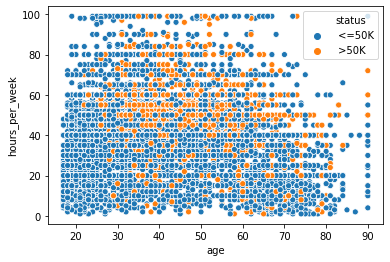

In [12]:
#let's plot the age to the amount of work done per week.
#we need to know the amount of hours spent working as the age gets higher or the person gets older
sns.scatterplot(x="age",y="hours_per_week",hue="status",data=data)

 the data is a bit much, but we can see that the older a person get, they work less hours per week as 
 the data points gets scantier as high as 70

In [13]:
#changing the data type of the continous columns
data["age"] = data["age"].astype("int64")
data["fnlgwt"] = data["fnlgwt"].astype("int64")
data["education_num"] = data["education_num"].astype("int64")
data["capital_gain"] = data["capital_gain"].astype("int64")
data["capital_loss"] = data["capital_loss"].astype("int64")
data["hours_per_week"] = data["hours_per_week"].astype("int64")

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32561 entries, 0 to 0
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlgwt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  32561 non-null  object
 14  status          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 2.9+ MB


(-0.5, 8.5)

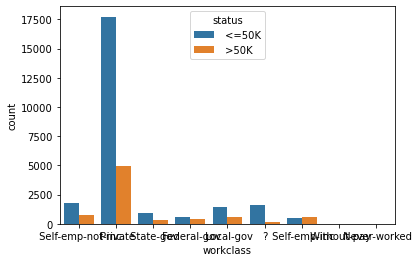

In [15]:
sns.countplot(x="workclass",hue="status",data=data)
plt.xlim()

 from the above plot, the private workers earn lesser than 50k dollars

<AxesSubplot:xlabel='age'>

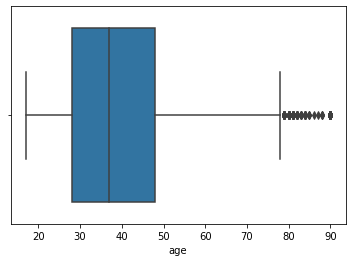

In [16]:
#make a boxplot on the age
sns.boxplot(x="age",data=data)

In [17]:
#check for null values
data.isna().sum()

age               0
workclass         0
fnlgwt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
status            0
dtype: int64

In [18]:
#importing needed libraries for encoding and clustering
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans

In [19]:
label = LabelEncoder()
data["status"] = label.fit_transform(data["status"])

In [20]:
#changes every categoricl column to a numerical one for easy feeding into model
data["occupation"] = label.fit_transform(data["occupation"])
data["workclass"] = label.fit_transform(data["workclass"])
data["education"] = label.fit_transform(data["education"])
data["marital_status"] = label.fit_transform(data["marital_status"])
data["relationship"] = label.fit_transform(data["relationship"])
data["race"] = label.fit_transform(data["race"])
data["sex"] = label.fit_transform(data["sex"])
data["native_country"] = label.fit_transform(data["native_country"])

In [21]:
#check new info about data
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32561 entries, 0 to 0
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   age             32561 non-null  int64
 1   workclass       32561 non-null  int32
 2   fnlgwt          32561 non-null  int64
 3   education       32561 non-null  int32
 4   education_num   32561 non-null  int64
 5   marital_status  32561 non-null  int32
 6   occupation      32561 non-null  int32
 7   relationship    32561 non-null  int32
 8   race            32561 non-null  int32
 9   sex             32561 non-null  int32
 10  capital_gain    32561 non-null  int64
 11  capital_loss    32561 non-null  int64
 12  hours_per_week  32561 non-null  int64
 13  native_country  32561 non-null  int32
 14  status          32561 non-null  int32
dtypes: int32(9), int64(6)
memory usage: 3.9 MB


In [22]:
#intialize cluster and create data we want to cluster on
#we choose age and hours per week as it makes enough sense
cluster = KMeans(n_clusters=2)
x_cluster = data[["age","hours_per_week"]]

In [23]:
#fit the cluster model and get cluster predictions
cluster.fit(x_cluster)

KMeans(n_clusters=2)

In [24]:
#we predict the clusters
cluster_pred = cluster.predict(x_cluster)

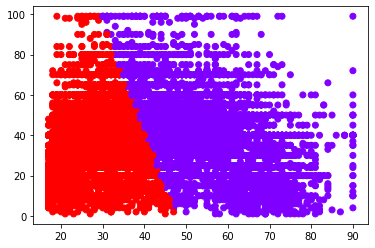

In [25]:
plt.scatter(data["age"],data["hours_per_week"],c=cluster_pred,cmap="rainbow")

from the above plot, we can see that as a person grow older from around 40, the hours they work reduce
where the purple is 1 and red is 0

In [26]:
#there is no need for standardization as this may affect the overall performance of our model
#so let's use a simple model of Logistic Regression then we can improve on it with Random Forest
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [27]:
#split the data into training and testing sets for measuring model performance. test take 20 percent of data
x_train,x_test,y_train,y_test = train_test_split(data.drop(["status"],axis=1),data["status"],test_size=0.2,random_state=42)

In [28]:
#check for the training shape
x_train.shape

(26048, 14)

In [29]:
x_test.shape

(6513, 14)

In [30]:
#initialize our base model and train on the training data
log = LogisticRegression()
log.fit(x_train,y_train)

LogisticRegression()

In [31]:
#predicting on the test data
log_pred = log.predict(x_test)

In [32]:
#import libraries for calculating model performance
from sklearn.metrics import confusion_matrix,classification_report

In [33]:
#get the coefficients for each feature we used to predict
coefficients = log.coef_

In [34]:
coefficients = coefficients.reshape(14,)

In [35]:
names = np.array(["age","workclass","fnlgwt","education","education_num","marital_status","occupation",
           "relationship","race","sex","capital_gain","capital_loss","hours_per_week","native_country"])

In [36]:
names = names.reshape(14,)

In [37]:
coefficient_table = pd.DataFrame()
coefficient_table["feature"] = names
coefficient_table["coefficient"] = coefficients

In [38]:
coefficient_table

,feature,coefficient
0,age,0.015643
1,workclass,-0.004606
2,fnlgwt,-0.000002
3,education,-0.009535
4,education_num,0.003136
5,marital_status,-0.012313
6,occupation,-0.002698
7,relationship,-0.013008
8,race,-0.004376
9,sex,0.001584


using the notion of p-values and calculating feature importance, it is clear every feature we used has a significant importance in predicting the status of a worker. the threshold is 0.5 and we can see that none of them crossed the threshold.

so therefore, we say the features are enough tom predict the status without dropping anyone

In [39]:
print(classification_report(y_test,log_pred))

              precision    recall  f1-score   support

           0       0.80      0.94      0.87      4909
           1       0.63      0.30      0.41      1604

    accuracy                           0.78      6513
   macro avg       0.72      0.62      0.64      6513
weighted avg       0.76      0.78      0.75      6513



In [40]:
print(confusion_matrix(y_test,log_pred))

[[4631  278]
 [1125  479]]


In [41]:
tot_pred = log.predict(data.drop(["status"],axis=1))

In [42]:
print(classification_report(data["status"],tot_pred))

              precision    recall  f1-score   support

           0       0.81      0.94      0.87     24720
           1       0.63      0.29      0.40      7841

    accuracy                           0.79     32561
   macro avg       0.72      0.62      0.64     32561
weighted avg       0.76      0.79      0.76     32561



In [43]:
print(confusion_matrix(data["status"],tot_pred))

[[23349  1371]
 [ 5543  2298]]


from the above reports, the model predicted 79% of the values correctly.
this is a good development for a model like Logistic Regression.

In [44]:
#let's save the model
import pickle

In [45]:
pickle.dump(label,open("label_encoder.pkl","wb"))

In [46]:
pickle.dump(log,open("log_model.pkl","wb"))

In [47]:
#now let's import our improved model and cross validation
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

In [48]:
#let's train without any cross validation first
rf = RandomForestClassifier(n_estimators=100,random_state=42)
rf.fit(x_train,y_train)

RandomForestClassifier(random_state=42)

In [51]:
#getting the feature importance of each variable to know the one that works best
importance = rf.feature_importances_
importance = importance.reshape(14,)

In [52]:
for name,coeff in zip(names,importance):
    print(f"{name}: {coeff}")

age: 0.15283491941586036
workclass: 0.04036318735707664
fnlgwt: 0.16863919823165577
education: 0.03334178897735661
education_num: 0.09125230267659924
marital_status: 0.06659972729043723
occupation: 0.06820114274906487
relationship: 0.10076991263154458
race: 0.01398086993669278
sex: 0.014510510154962379
capital_gain: 0.1124973588928051
capital_loss: 0.03503326993029463
hours_per_week: 0.08498956728366089
native_country: 0.01698624447198882


In [58]:
rf_predict = rf.predict(x_test)

In [59]:
print(classification_report(y_test,rf_predict))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91      4909
           1       0.75      0.64      0.69      1604

    accuracy                           0.86      6513
   macro avg       0.82      0.79      0.80      6513
weighted avg       0.85      0.86      0.85      6513



In [60]:
rf_tot = rf.predict(data.drop(["status"],axis=1))

In [61]:
print(classification_report(data["status"],rf_tot))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98     24720
           1       0.95      0.93      0.94      7841

    accuracy                           0.97     32561
   macro avg       0.97      0.96      0.96     32561
weighted avg       0.97      0.97      0.97     32561



Our Random Forest classifier did well than the logistic regression with an 86% accuracy on the test set and a 97% accuracy on the total data.

This is a welcome development and we can rely on our modek to perform well

In [62]:
#time for some cross validation
n_estimators = [0,10,100,500,1000]
random_state = [0,12,42,101,150]